In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning) ## suppress annoying deprecation warnings

from datetime import datetime

import pandas as pd
import seaborn.objects as so
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style

import plotly.express as px

from sklearn import tree
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.model_selection import cross_validate

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Part 0: Get data set for plotting ###
using meteostat API and list of capital cities around the globe

In [3]:
from datetime import datetime, timedelta
from meteostat import Stations, Daily, Hourly

## Time period March 2024 
start = datetime(2024, 3, 1, 0, 0, 0, 0)
end = datetime(2024, 3, 20, 0, 0, 0, 0)
start_hourly = datetime(2024, 3, 1, 0, 0, 0, 0)
end_hourly = datetime(2024, 3, 21, 0, 0, 0, 0)

stations = Stations()
all_stations = stations.fetch(sample = True)

### Get closest weather station to capital geo-position (solves some problems with name matching etc.) ###
cap_long_lat = pd.read_csv("capitals.txt", sep="\t")
station_ids = []
for c in cap_long_lat.index.to_list():
	stations = Stations()
	stations = stations.nearby(cap_long_lat["Latitude"][c], cap_long_lat["Longitude"][c])
	stations = stations.inventory('hourly', end) ## Check for active station for time period
	stations = stations.inventory('daily', end) ## Check for active station for time period
	station = stations.fetch(1)
	station_ids.append(station.index[0])

selected_stations = all_stations.loc[station_ids,:].drop_duplicates() ## get rid of duplicates if the closest station is the same for mutliple capitals
# convert id into flat index
flat_index_selected_stations = selected_stations.index.to_flat_index()
# append it to dataframe
selected_stations['station'] = flat_index_selected_stations
# get daily data from one station
daily_station_weather_data = (Daily(selected_stations, start, end)).fetch()
cleaned_daily_weather_data = daily_station_weather_data.drop(columns=['snow', 'wpgt', 'tsun'])
dict_weather_codes = {
    1:'Clear', 
    2:'Fair', 
    3:'Cloudy', 
    4:'Overcast', 
    5:'Fog', 
    6:'Freezing Fog', 
    7: 'Light Rain', 
    8: 'Rain', 
    9: 'Heavy Rain', 
    10: 'Freezing Rain',
    11: 'Heavy Freezing Rain', 
    12: 'Sleet', 
    13: 'Heavy Sleet',
    14: 'Light Snowfall',
    15:	'Snowfall',
    16: 'Heavy Snowfall',
    17:	'Rain Shower',
    18:	'Heavy Rain Shower',
    19: 'Sleet Shower',
    20: 'Heavy Sleet Shower',
    21:	'Snow Shower',
    22:	'Heavy Snow Shower',
    23:	'Lightning',
    24:	'Hail',
    25:	'Thunderstorm',
    26:	'Heavy Thunderstorm',
    27:	'Storm'}

#hourly data
# get hourly data from one station
hourly_station_weather_data = Hourly(selected_stations, start_hourly, end_hourly)
hourly_weather_data = hourly_station_weather_data.fetch()
# get column weather condition codes 'coco'
hourly_measurements = pd.DataFrame(hourly_weather_data[['dwpt','rhum', 'coco']])
# transform integer numbers to text provided in dict
weather_condition_names = pd.DataFrame(hourly_measurements['coco'].map(dict_weather_codes))
hourly_measurements.drop(columns=['coco'], inplace=True)
hourly_measurements_names = pd.merge(hourly_measurements, weather_condition_names, left_index=True, right_index=True)
# Reset the index to make 'time' a column
hourly_measurements_names.reset_index(inplace=True)
# Filter rows where time is '16:00:00'
daily_measurements_names = hourly_measurements_names[hourly_measurements_names['time'].dt.time == pd.to_datetime('16:00:00').time()]
# Set the index back to ['station', 'time']
daily_measurements_names.set_index(['time'], inplace=True)
# convert column time to flat index
time_flat_index = daily_measurements_names.index.to_flat_index()

# reset indices of dataframes
daily_measurements_names.reset_index(drop=True, inplace=True)
cleaned_daily_weather_data.reset_index(drop=True, inplace=True)

# merge dataframes along column axis
all_weather_data = pd.concat([cleaned_daily_weather_data, daily_measurements_names], axis=1)
all_weather_data.insert(0, 'time', time_flat_index)

# move station column
station_column = all_weather_data.pop('station')  # Remove 'station' column
all_weather_data.insert(1, 'station', station_column)

weather_and_stations = pd.merge(selected_stations, all_weather_data, on='station')
weather_and_stations
weather_and_stations.to_csv('global_weather.csv',  date_format='%Y-%m-%d', index=False)


# Part 1: Time series and other simple plots

In [4]:
weather_df = pd.read_csv('global_weather.csv', parse_dates=['time']) 
weather_df = weather_and_stations.dropna()


weather_df = weather_df.assign(Continent = weather_df["timezone"].str.split('/').str[0])  ## Get continent from timezone column

weather_df.loc[weather_df["name"] == "Berlin / Tempelhof",:]  ## Let's have a look at a single city (capital)

,name,country,region,wmo,icao,latitude,longitude,elevation,timezone,hourly_start,...,tmin,tmax,prcp,wdir,wspd,pres,dwpt,rhum,coco,Continent
1420,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,0.0,10.0,0.0,104.0,16.2,1010.4,6.3,80.0,Overcast,Europe
1421,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,2.9,12.7,0.0,91.0,20.5,1003.9,6.7,68.0,Overcast,Europe
1422,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,4.4,14.1,0.0,153.0,12.2,1004.9,6.5,64.0,Overcast,Europe
1423,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,3.9,15.8,0.0,257.0,9.7,1013.4,6.8,74.0,Clear,Europe
1424,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,6.1,14.4,0.4,225.0,9.0,1016.6,-1.0,63.0,Clear,Europe
1425,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,7.3,15.9,0.0,199.0,9.0,1014.6,1.1,66.0,Overcast,Europe
1426,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,7.2,18.7,0.0,197.0,11.2,1009.8,-3.1,48.0,Clear,Europe
1427,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,4.2,15.2,1.2,253.0,17.6,1014.4,-2.9,45.0,Clear,Europe
1428,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,0.2,9.3,0.0,312.0,15.8,1023.7,2.1,60.0,Overcast,Europe
1429,Berlin / Tempelhof,DE,BE,10384,EDDI,52.4667,13.4,50.0,Europe/Berlin,1929-08-01,...,-2.4,7.5,0.0,93.0,13.0,1022.0,4.8,62.0,Overcast,Europe


## My first seaborn.objects plot

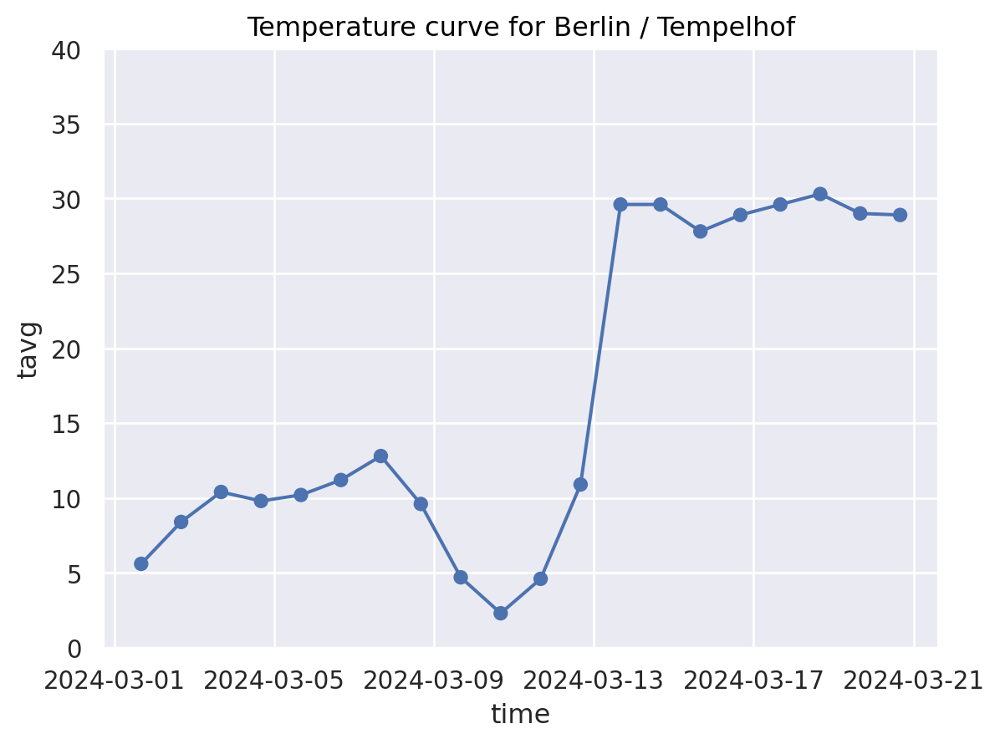

In [5]:
so.Plot.config.display["scaling"] = 1.0 ## Adjust standard output size to your liking 

(
    so.Plot(
		weather_df.loc[weather_df["name"] == "Berlin / Tempelhof",:],   ## Data layer (required)
		x="time", y="tavg")                          					## Axis mapping layer (required)
    .add(so.Dot())                                                  	## Geometry layer (at least one required)
	.add(so.Line())                                                 	# Connect with lines (optional geometry layer)
	.limit(y=(0, 40))                                               	# Coordinate layer (optional: problem avoid free y-axis)
    .label(title="Temperature curve for Berlin / Tempelhof")            # Theme and label layers (optional)
)

## Plotting distributions
### How is the temperature range over all cities?

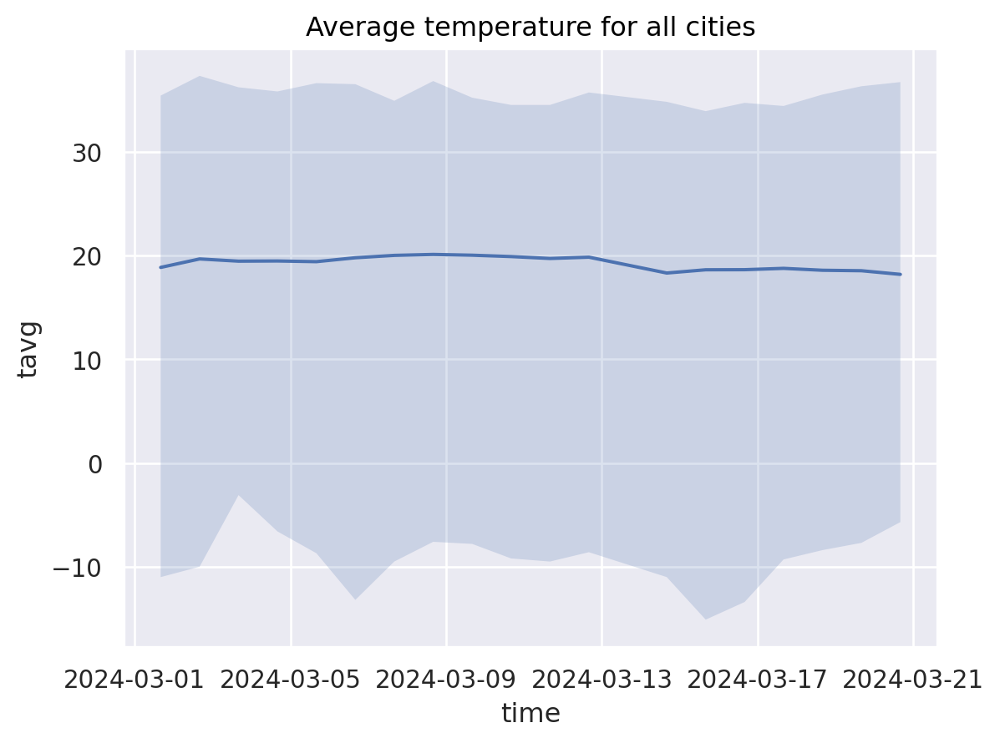

In [9]:
miss_timepoint= weather_df.time == datetime(2024, 3, 13, 16, 0, 0, 0) ## Simulate a missing timepoint and see what happens in plots
(
	so.Plot(weather_df[~miss_timepoint], x="time", y="tavg")  ## Can you spot the missing time point?
    # so.Plot(weather_df, x="time", y="tavg")
    .add(so.Band()) 										# Geometry: Min-Max Band
	.add(so.Line(), 										# Geometry: Line
	   so.Agg(func='mean'))    								# Statistic: Mean
    .label(title="Average temperature for all cities")
)

### What are so.Band and so.Agg doing in the backgorund?

In [7]:
weather_agg = pd.concat(
	[weather_df.loc[:,["time","tavg"]].groupby(["time"]).min(), 	## so.Band - min-part
	weather_df.loc[:,["time","tavg"]].groupby(["time"]).mean(), 	## so.Line, so.Agg
	weather_df.loc[:,["time","tavg"]].groupby(["time"]).max(),	## so.Band - max-part
	weather_df.loc[:,["time","tavg"]].groupby(["time"]).count()	## Let's check how many cities are aggregated
	], 
	axis=1
)
weather_agg.columns = ["temp_min","temp_avg", "temp_max","nb_cities"]

weather_agg.head(n=10)

,temp_min,temp_avg,temp_max,nb_cities
time,,,,
2024-03-01 16:00:00,-11.0,18.842553,35.4,141
2024-03-02 16:00:00,-10.0,19.658696,37.3,138
2024-03-03 16:00:00,-3.1,19.443972,36.2,141
2024-03-04 16:00:00,-6.6,19.460993,35.8,141
2024-03-05 16:00:00,-8.7,19.396429,36.6,140
2024-03-06 16:00:00,-13.2,19.773103,36.5,145
2024-03-07 16:00:00,-9.5,20.001408,34.9,142
2024-03-08 16:00:00,-7.6,20.092254,36.8,142
2024-03-09 16:00:00,-7.8,20.018571,35.2,140


### Another visualization (date is categorical, show data range not as min-max but as errorbar)
Which visualization is better to see missing timepoint?

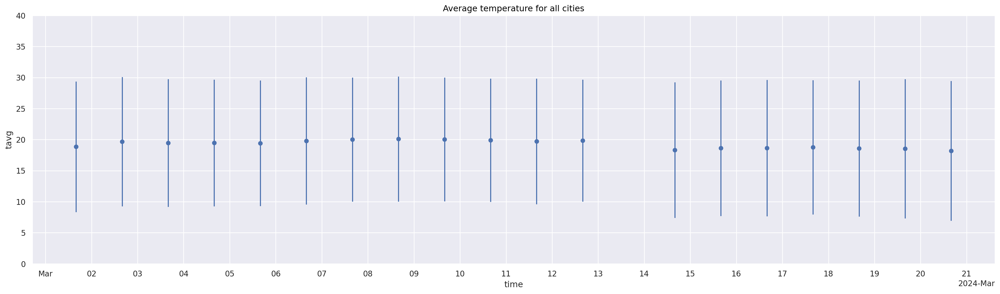

In [30]:
(
# so.Plot(weather_df, x="time", y="tavg")	
so.Plot(weather_df[~miss_timepoint], x="time", y="tavg")	## Can you spot the missing time point?
	.add(so.Dot(), so.Agg()) 									# Geometry: Dot + Statistic: Mean
	.add(so.Range(), so.Est(errorbar="sd")) 					# Geometry: Range + Statistic: Standard deviation
	.limit(y=(0, 40))
	.layout(size=(20, 6)) 										# Increase the figure size for a better view
	.scale(
		x=so.Temporal().tick(upto=30).label(concise=True) 		# Increase the tick size and adjust tick labels for legibility
	)
	.label(title="Average temperature for all cities")
)

## The problem of Spaghetti Plots

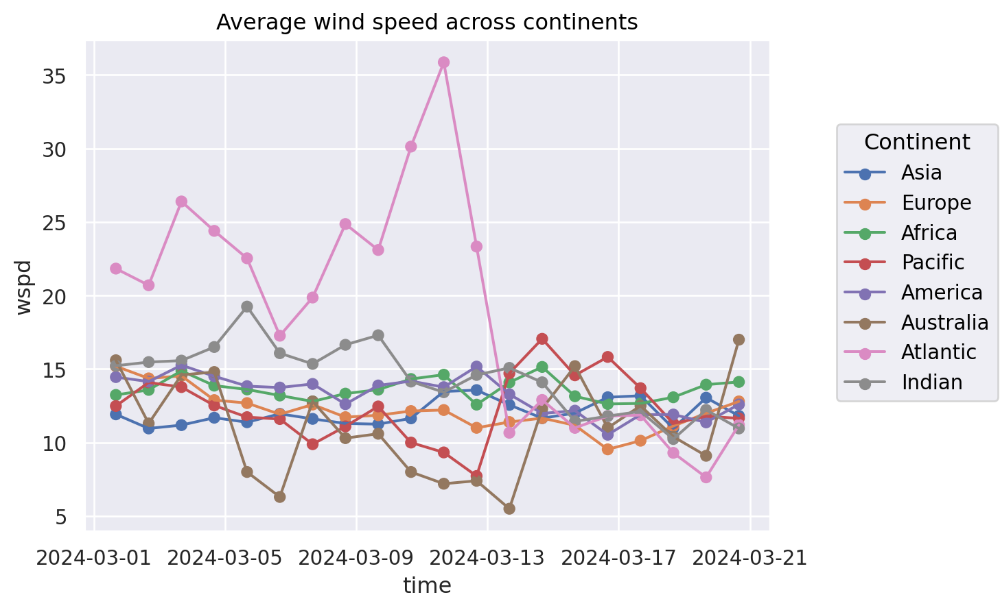

In [31]:
(
    so.Plot(weather_df, x="time", y="wspd", color="Continent")
		.add(so.Dot(), so.Agg())
		.add(so.Line(), so.Agg())
		.label(title="Average wind speed across continents")
)

### Alternatives: (1) Highlighting

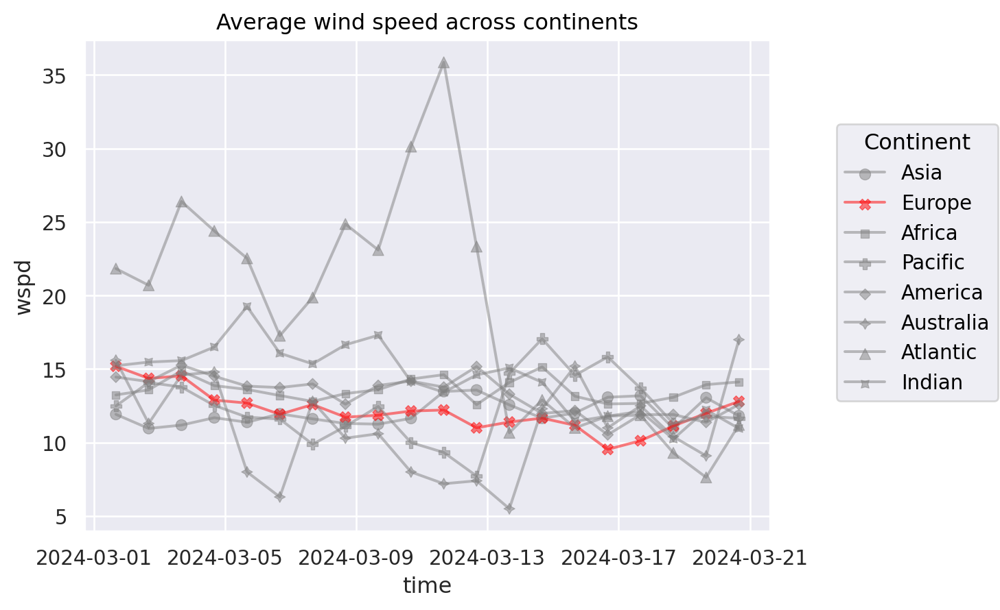

In [32]:
(
    so.Plot(weather_df, x="time", y="wspd", color="Continent")
		.add(so.Dot(alpha=0.5), so.Agg(), marker="Continent")		# set transparency by alpha 
		.add(so.Line(alpha=0.5), so.Agg() )
		.scale(color=(							# Control the color scale
			"gray",								# Asia
			"red",								# Highlight Europe
			"gray",								# Africa
			"gray",								# Pacific
			"gray",								# America
			"gray",								# Australia
			"gray",								# Atlantic
			"gray"								# Indian
			))
		.label(title="Average wind speed across continents")
)


### Alternatives: (2) Facet

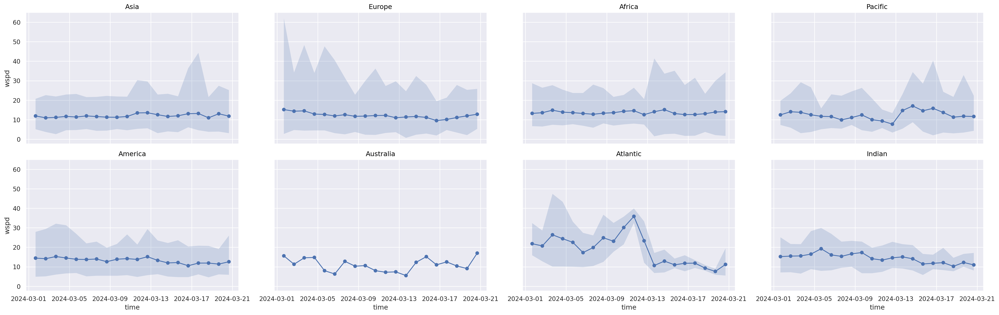

In [35]:
(
    so.Plot(weather_df, x="time", y="wspd")
		.add(so.Dot(), so.Agg())
		.add(so.Line(), so.Agg())
		.add(so.Band())
		.facet("Continent", wrap=4)		# All you need for subplots
		.layout(size=(25, 8))
)

## Example: relationship of temperature, date and latitude (south - north)
### How to not do it: spaghetti line plot

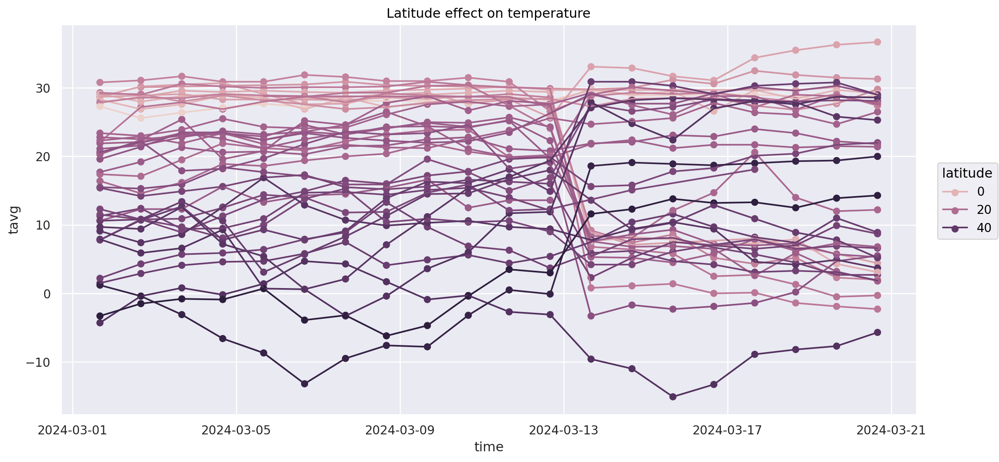

In [36]:
(
	so.Plot(weather_df.loc[weather_df["Continent"] == "Asia"], x="time", y="tavg", color="latitude")
	# so.Plot(weather_df.loc[weather_df["Continent"] == "Europe"], x="time", y="wspd", color="elevation")
    .add(so.Dot())
	.add(so.Line())
    .layout(size=(12, 6))
    .label(title="Latitude effect on temperature")
)

### Alternative: Dot array and flip latitude and temperature axis

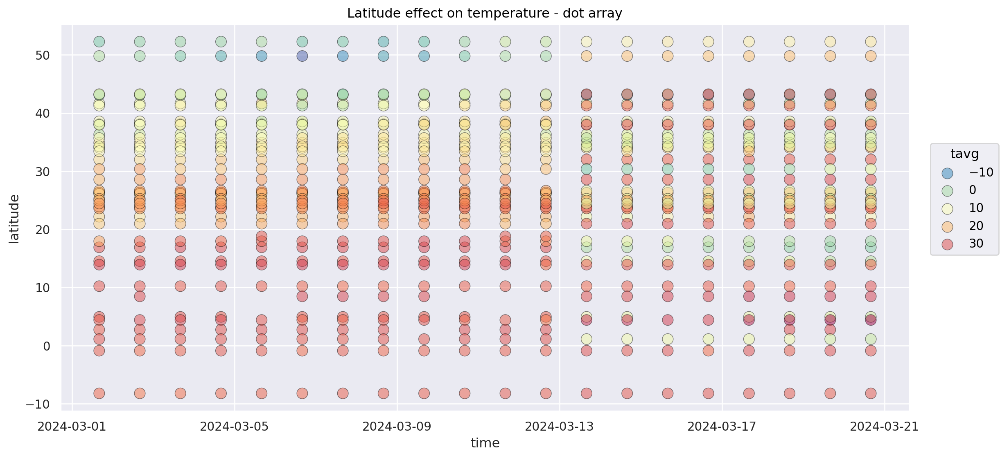

In [37]:
(
	so.Plot(weather_df.loc[weather_df["Continent"] == "Asia"], x="time", y="latitude", color="tavg")
    .add(so.Dot(alpha=0.5, pointsize=10, edgecolor="black"))
	.scale(
        color = so.Continuous("Spectral_r").tick(upto=10) # Important: choosing an intuitive colormap (https://seaborn.pydata.org/tutorial/color_palettes.html)
        ) 
    .layout(size=(12, 6))
    .label(title="Latitude effect on temperature - dot array")
)

### Alternative: Heatmap like (via Dash)

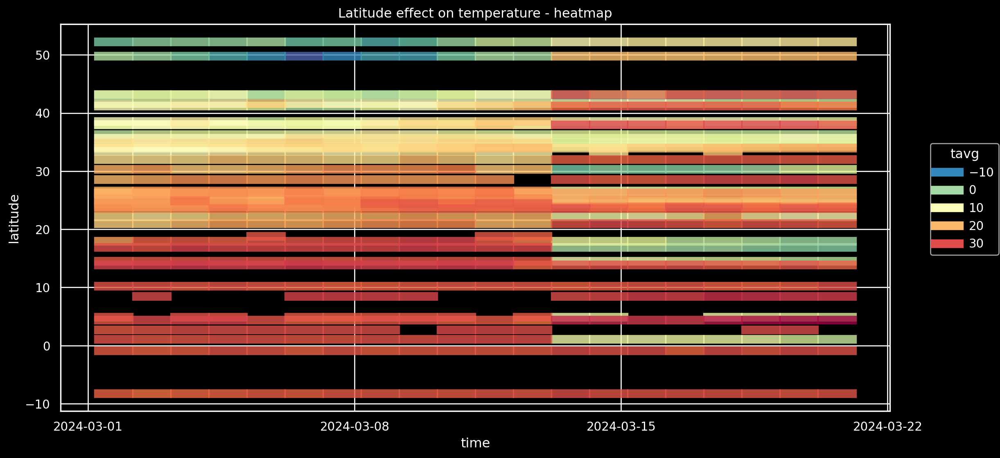

In [47]:
(
    so.Plot(weather_df.loc[weather_df["Continent"] == "Asia"], x="time", y="latitude", color="tavg")
	.add(so.Dash(alpha=0.8, width=0.8,  linewidth=8))
	.scale(
        color=so.Continuous("Spectral_r").tick(upto=10)
        )
    .layout(size=(12, 6))
	.theme({**style.library["dark_background"]}) # Increasing visibility on screens?
    .label(title="Latitude effect on temperature - heatmap")
)

### On all continents? no problem: facet

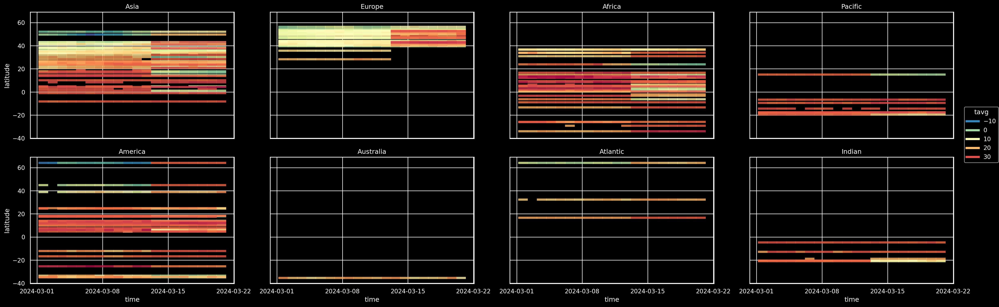

In [48]:
(
    so.Plot(weather_df, x="time", y="latitude", color="tavg")
    .add(so.Dash(alpha=0.8, width=0.8,  linewidth=4))
	.scale(
        color=so.Continuous("Spectral_r").tick(upto=10)
        )
	.facet("Continent", wrap=4).layout(size=(25, 8))
	.theme({**style.library["dark_background"]}) 
)

## Example: what to do if you want to plot 3-4 variables?
### interactive 3D plot with plotly

In [46]:

fig = px.scatter_3d(weather_df, x="dwpt", y="latitude", z="tavg",
                    color="rhum", ## uv_index for fourth dimension
					opacity=0.7) 
fig.update_traces(marker_size = 4)  # Make dots smaller
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0)) # Reduce figure margins
fig.show()

# Part 2 Data exploration by unsupervised learning

## Dimension reduction by PCA and t-SNE

In [31]:
weather_df.select_dtypes(include='number') ## Only on numerical attributes of weather data 

,latitude,longitude,elevation,tavg,tmin,tmax,prcp,wdir,wspd,pres,dwpt,rhum
0,34.0167,71.5833,359.0,12.3,9.6,13.0,5.1,334.0,7.3,1015.4,11.0,100.0
1,34.0167,71.5833,359.0,10.8,9.0,12.5,65.0,12.0,11.7,1005.5,10.0,100.0
2,34.0167,71.5833,359.0,8.9,5.5,13.0,16.0,330.0,20.4,1012.6,5.0,94.0
3,34.0167,71.5833,359.0,11.3,4.5,18.0,0.0,270.0,14.2,1020.1,3.0,54.0
4,34.0167,71.5833,359.0,13.7,5.5,21.5,0.0,222.0,13.7,1019.3,1.9,50.0
...,...,...,...,...,...,...,...,...,...,...,...,...
3687,28.4500,-13.8667,22.0,19.9,16.7,22.0,0.0,32.0,12.2,1018.1,8.3,44.0
3688,28.4500,-13.8667,22.0,23.0,18.8,28.0,0.0,0.0,12.5,1016.2,16.1,65.0
3689,28.4500,-13.8667,22.0,21.9,20.0,26.0,0.0,331.0,27.7,1016.2,12.0,50.0
3690,28.4500,-13.8667,22.0,20.2,18.0,23.0,0.0,19.0,24.9,1017.0,13.2,61.0


In [32]:
scaler = StandardScaler().set_output(transform="pandas") # Features need to be scaled for dimension reduction

weather_d2_tsne = TSNE(n_components=2, perplexity=50).fit_transform(							## Define and perform dimension reduction
							scaler.fit_transform(weather_df.select_dtypes(include='number')) 	## Scale Data first; only numerical features can be used
							)
weather_d2_pca = PCA(n_components=2).fit_transform(scaler.fit_transform(weather_df.select_dtypes(include='number')))

weather_df = weather_df.assign(TSNE1= weather_d2_tsne[:,0]) ## Add as additional columns for easy plotting
weather_df = weather_df.assign(TSNE2= weather_d2_tsne[:,1])

weather_df = weather_df.assign(PC1= weather_d2_pca[:,0])
weather_df = weather_df.assign(PC2= weather_d2_pca[:,1])

## Scatter plots
### (1) simple plot with no additional information

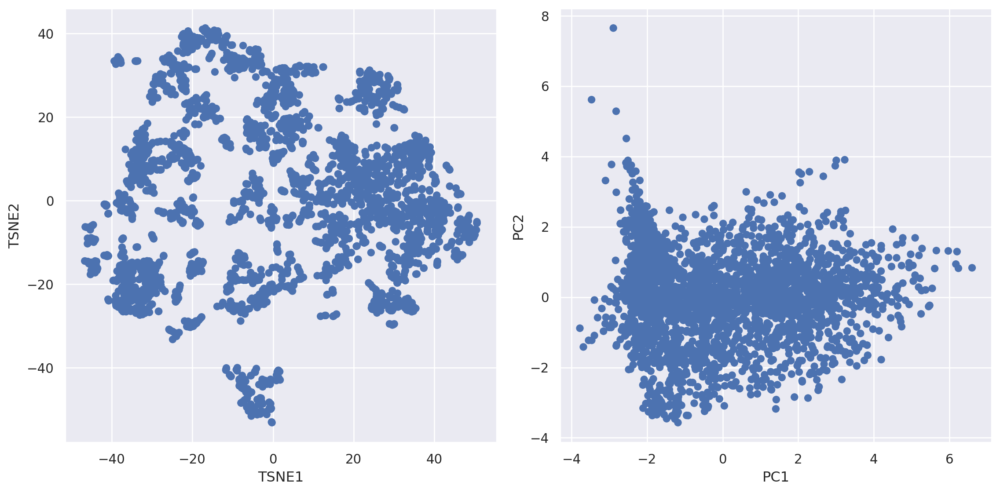

In [33]:
(
    so.Plot(weather_df)
	.pair(x=["TSNE1","PC1"], y=["TSNE2","PC2"], cross=False) # pair as cousin of facet (sharing of axes)
    .layout(size=(12, 6))
    .add(so.Dot())
)

### (2) After reducing to two dimension we can overlay with numerical and categorical features for exploration of potential clusters

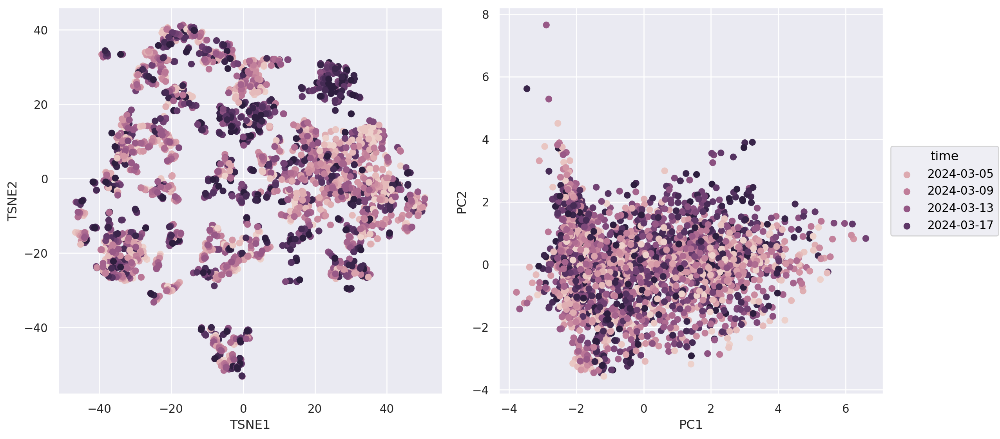

In [34]:
(
	so.Plot(weather_df, color="time")
    .pair(x=["TSNE1","PC1"], y=["TSNE2","PC2"], cross=False)
    .layout(size=(12, 6))
    .add(so.Dot())
)

### (3) How about atmospheric pressure?

Interestingly, intuitive color assignment for low/high pressure seems to be reversed in US (https://as1.ftcdn.net/v2/jpg/02/74/36/92/1000_F_274369230_Kvnl7UddxtOPCV0CDMwX6I0y6m1GezDo.jpg) compared to Germany (https://bluewhale.ch/wp-content/uploads/2020/02/Profi-Isobaren-Wetter-Karte.jpg)

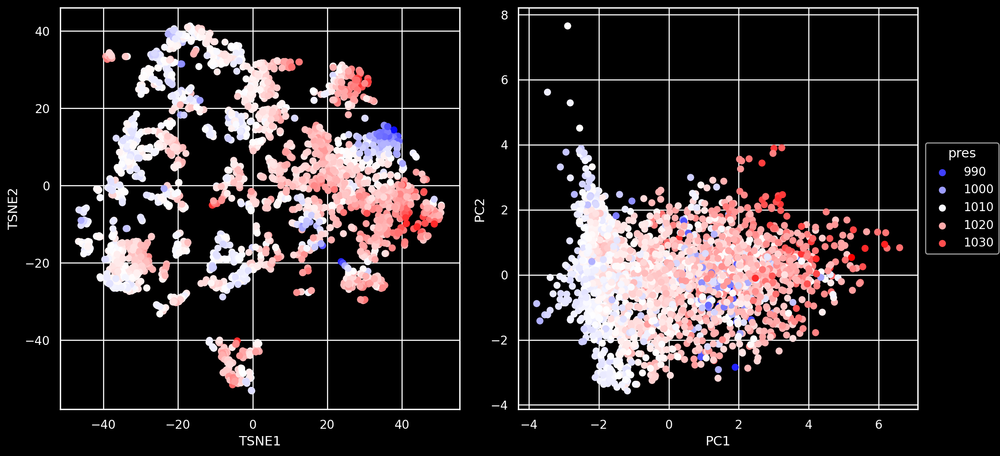

In [35]:
(
    so.Plot(weather_df, color="pres")
    .pair(x=["TSNE1","PC1"], y=["TSNE2","PC2"], cross=False)
    .scale(color=so.Continuous("bwr").tick(upto=10)) ## Again important to choose an intuitive colormap. 
    .layout(size=(12, 6))
    .add(so.Dot())
	.theme({**style.library["dark_background"]})  ## If midpoint is white, a dark background is desirable
)

## Tackling the overplotting issue in scatter plots

Strategies:
1) smaller markers
2) transparency to show density
3) marker edges 

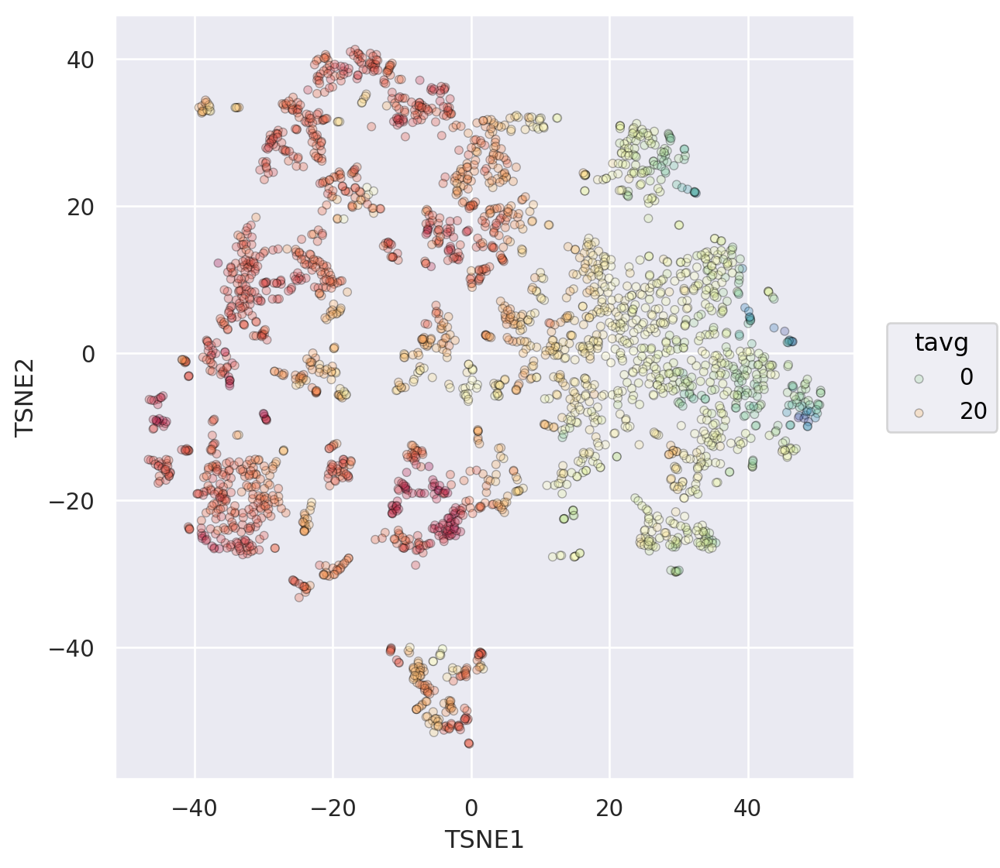

In [40]:
(
    so.Plot(weather_df, x="TSNE1", y="TSNE2", color="tavg")
	.add(so.Dot(alpha=0.3, pointsize=4, edgecolor="black")) # adjusting pointsize, introduce transparency, edges increase visibility (dark, bright)
	.scale(color="Spectral_r") # reverse
	.layout(size=(6, 6))
)

## Avoid overplotting by facet subgroups

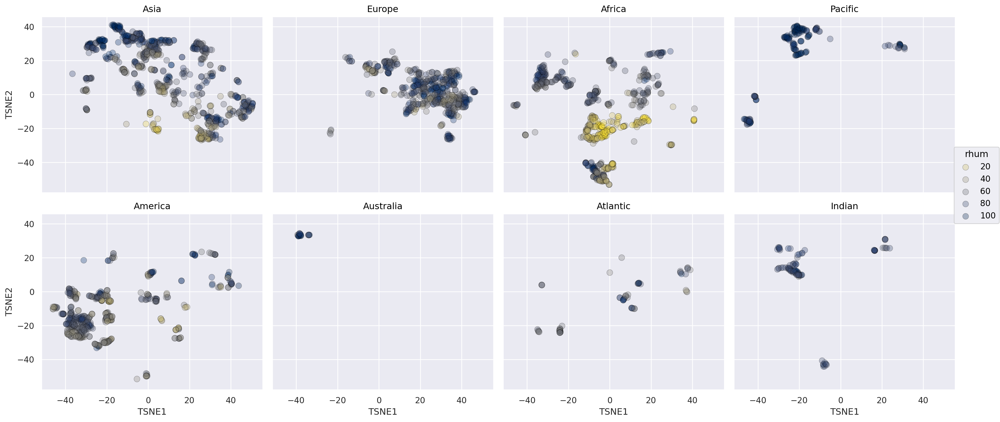

In [41]:
(
	so.Plot(weather_df, x="TSNE1", y="TSNE2", color="rhum")
	.facet("Continent", wrap=4).layout(size=(18, 8))
    .add(so.Dot(alpha=0.3, pointsize=8, edgecolor="black"))
	.scale(color="cividis_r")
)

## Alternative: 2D density and histogram plots (unfortunately not available via seaborn.object API)

<Axes: xlabel='TSNE1', ylabel='TSNE2'>

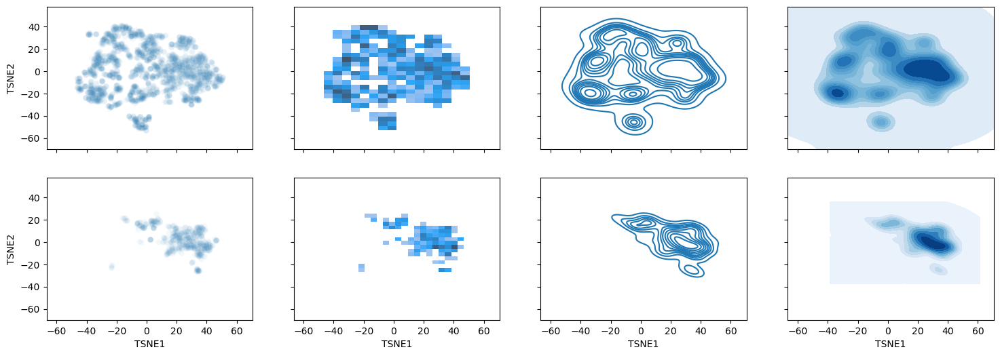

In [42]:
f, axes = plt.subplots(2,4, figsize=(18, 6), sharex=True, sharey=True)

sns.scatterplot(data=weather_df ,x="TSNE1", y="TSNE2", ax=axes[0,0], alpha=0.05)	## Scatter plot with very low alpha
sns.histplot(data=weather_df ,x="TSNE1", y="TSNE2", ax=axes[0,1])					## Tiles showing density (low resolution)
sns.kdeplot(data=weather_df ,x="TSNE1", y="TSNE2", ax=axes[0,2])					## Isoclines of density (high resolution)
sns.kdeplot(data=weather_df ,x="TSNE1", y="TSNE2", ax=axes[0,3], fill=True, thresh=0, levels=10, cmap="Blues",)	## Filled density (high resolution) 
## try out high number of levels -> what is maximum number you can discriminate before blurring out?


## For a single continent for comparison 
sns.scatterplot(data=weather_df.where(weather_df['Continent'] == "Europe") ,x="TSNE1", y="TSNE2", ax=axes[1,0], alpha=0.05)
sns.histplot(data=weather_df.where(weather_df['Continent'] == "Europe") ,x="TSNE1", y="TSNE2", ax=axes[1,1])
sns.kdeplot(data=weather_df.where(weather_df['Continent'] == "Europe") ,x="TSNE1", y="TSNE2", ax=axes[1,2])
sns.kdeplot(data=weather_df.where(weather_df['Continent'] == "Europe") ,x="TSNE1", y="TSNE2", ax=axes[1,3], fill=True, thresh=0, levels=10, cmap="Blues")

## Analysis of clusters

In [46]:
clustering = KMeans(n_clusters=8, random_state=42).fit(
# clustering = KMeans(n_clusters=??).fit(
	StandardScaler().fit_transform(
		weather_d2_tsne
			)
		)

clustering.labels_

array([3, 4, 0, ..., 3, 1, 1], dtype=int32)

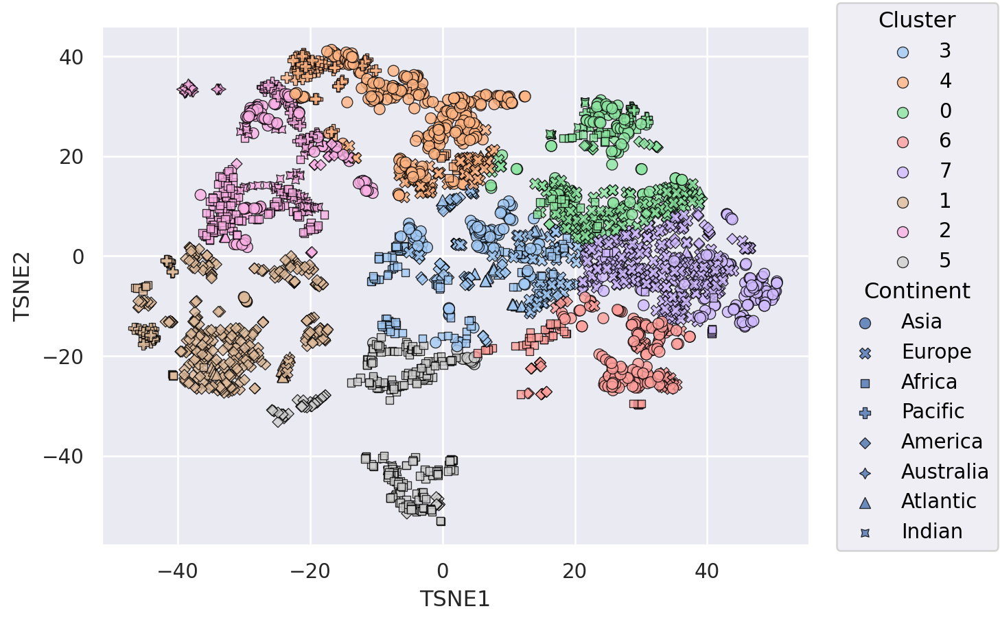

In [53]:
weather_df = weather_df.assign(Cluster= [str(x) for x in clustering.labels_]) ## Add Cluster labels to dataframe for plotting

(
	so.Plot(weather_df, x="TSNE1", y="TSNE2", color="Cluster", marker="Continent") # Try out visualize cluster assignment by color and marker
    .add(so.Dot(alpha=0.8, pointsize=6, edgecolor="black"))	
	.scale(color="pastel") # Important to use a colormap for categorical data
)

### Let's have a look on Cluster if it is enriched with European cities

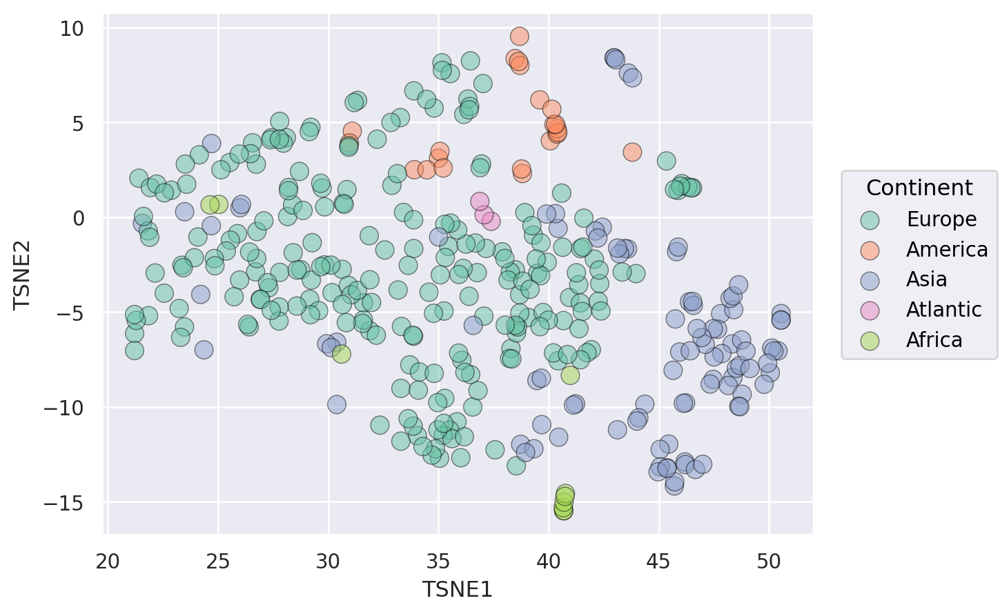

In [55]:
(
	so.Plot(weather_df.loc[weather_df["Cluster"]== "7",:], x="TSNE1", y="TSNE2", color="Continent") 
	# so.Plot(weather_df.loc[weather_df["Cluster"]== "7",:], x="TSNE1", y="TSNE2", marker="Continent") 
    .add(so.Dot(alpha=0.5, pointsize=10, edgecolor="black"))	
	.scale(color="Set2")
)

# Part 3: Machine Learning insights by Data Viz

## Plotting feature correlation: first try

<Axes: >

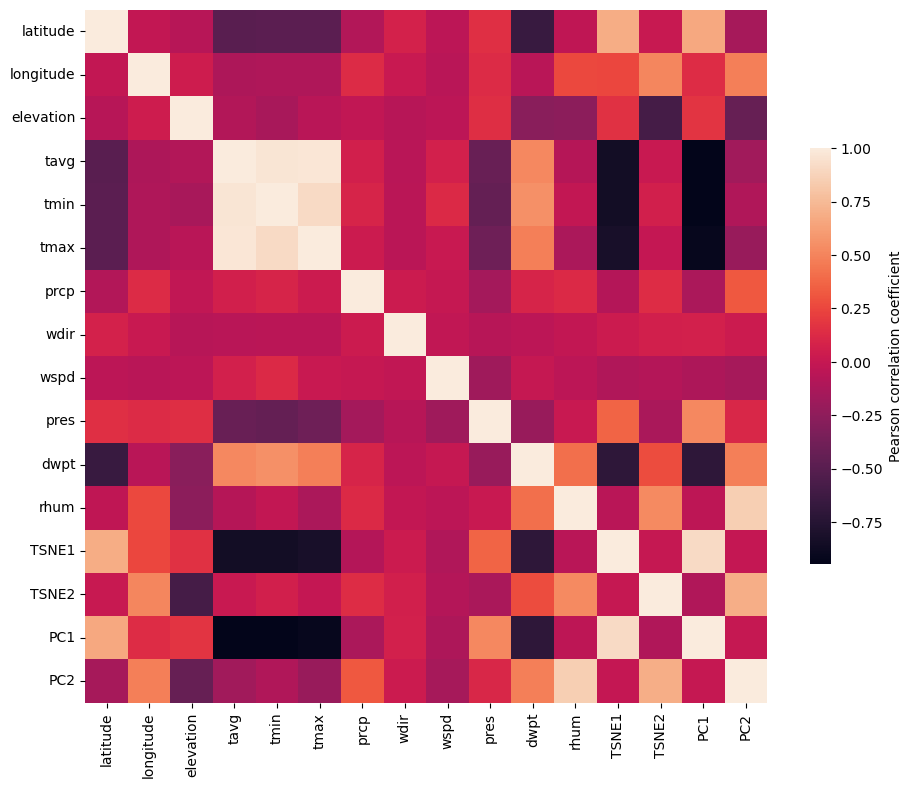

In [56]:
weather_corr = weather_df.select_dtypes(include='number').corr() ## Calculate (Pearson) correlation for all numerical features in dataframe

f, ax = plt.subplots(figsize=(11, 9))
sns.heatmap(weather_corr, ## seaborn.object no function for heatmaps yet
			cbar_kws={"label": "Pearson correlation coefficient", "shrink": 0.6}) ## Label adjustments

## Problem with standard correlation heatmap: colormap not suitable and features not ordered by similarity

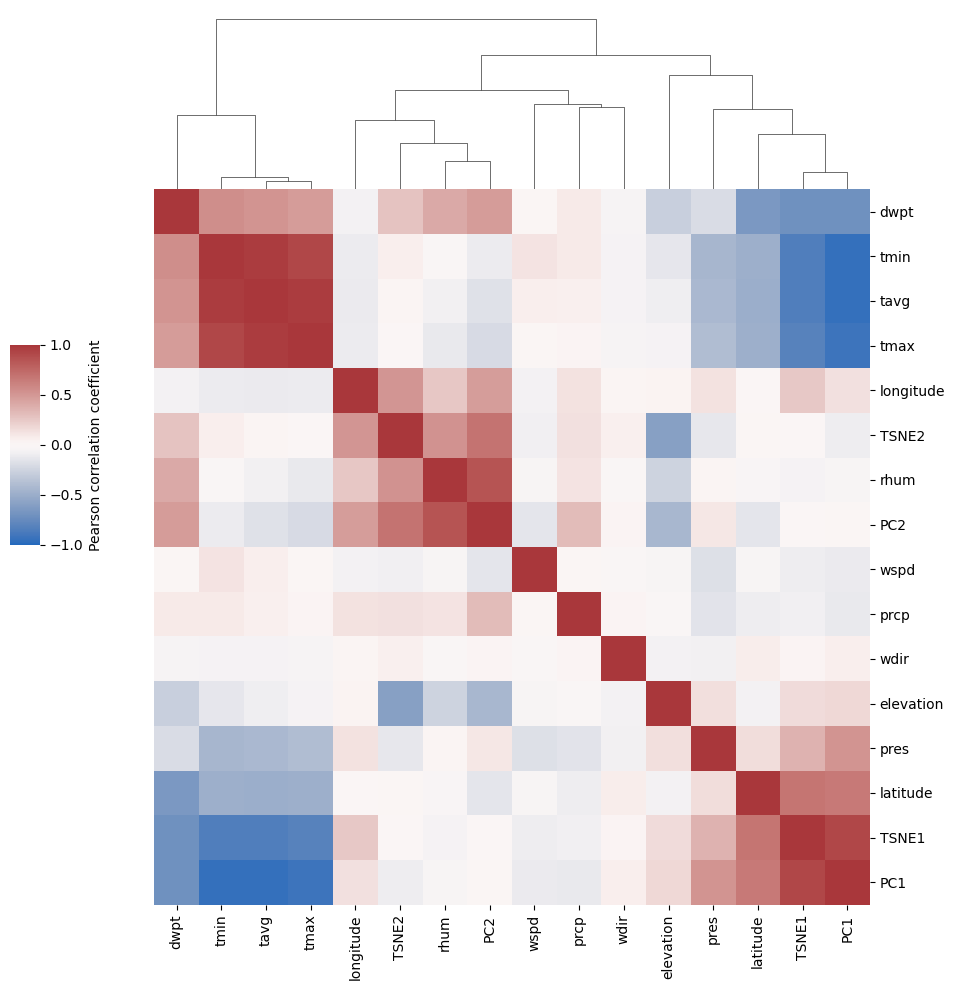

In [57]:
sns.clustermap(weather_corr,                                            ## Clustermap will cluster the features by similarity
			    cmap='vlag',center=0, vmin=-1, vmax=1,                  ## Colormap: correlations range from -1 to +1 and have fixed midpoint at 0                                  
				cbar_kws={"label": "Pearson correlation coefficient"},  ## Color legend description
                cbar_pos = (0.05, 0.45, 0.03, 0.2)						## Change the weird default position of legend
				).ax_row_dendrogram.set_visible(False)					## Dendrogram of feature similarity is identical (symmetric matrix); we can omit it on one side

## What can be seen in the correlation heatmap?
(1) features with (almost) identical information (redundancy) <br>
(2) association of learned embeddings (t-SNE, PCA) with features

## ML show case: predict the manuel text annotation of the weather by the numerical features

In [58]:
weather_df['coco'].value_counts()

coco
Cloudy               829
Fair                 728
Clear                544
Overcast             233
Fog                  108
Light Rain           106
Rain                  67
Heavy Rain Shower     60
Heavy Rain            48
Rain Shower           29
Thunderstorm          20
Light Snowfall        11
Snow Shower            4
Sleet                  4
Snowfall               3
Heavy Snowfall         3
Heavy Snow Shower      3
Heavy Sleet            1
Name: count, dtype: int64

## For simplicity reducing to Top categories

In [59]:
weather_df_red = weather_df[
	weather_df['coco'].isin( 
		weather_df['coco'].value_counts()[0:6].index  ## Top categories
		) 
	]

weather_df_red

,name,country,region,wmo,icao,latitude,longitude,elevation,timezone,hourly_start,...,pres,dwpt,rhum,coco,Continent,TSNE1,TSNE2,PC1,PC2,Cluster
1,Peshawar,PK,N,41530,OPPS,34.0167,71.5833,359.0,Asia/Karachi,1944-01-01,...,1005.5,10.0,100.0,Clear,Asia,-15.067150,22.516251,0.623139,2.992731,4
2,Peshawar,PK,N,41530,OPPS,34.0167,71.5833,359.0,Asia/Karachi,1944-01-01,...,1012.6,5.0,94.0,Cloudy,Asia,28.161520,7.029145,1.706247,1.395227,0
3,Peshawar,PK,N,41530,OPPS,34.0167,71.5833,359.0,Asia/Karachi,1944-01-01,...,1020.1,3.0,54.0,Fair,Asia,22.393406,-8.953990,2.026947,-0.210757,6
4,Peshawar,PK,N,41530,OPPS,34.0167,71.5833,359.0,Asia/Karachi,1944-01-01,...,1019.3,1.9,50.0,Fog,Asia,22.365568,-9.133661,1.713913,-0.478511,6
5,Peshawar,PK,N,41530,OPPS,34.0167,71.5833,359.0,Asia/Karachi,1944-01-01,...,1015.7,4.9,51.0,Fog,Asia,8.508280,4.241070,1.418955,-0.310454,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3687,Fuerteventura / Aeropuerto,ES,CN,60035,GCFV,28.4500,-13.8667,22.0,Europe/Madrid,1950-03-27,...,1018.1,8.3,44.0,Cloudy,Europe,14.013895,14.462549,0.349859,-0.833604,0
3688,Fuerteventura / Aeropuerto,ES,CN,60035,GCFV,28.4500,-13.8667,22.0,Europe/Madrid,1950-03-27,...,1016.2,16.1,65.0,Cloudy,Europe,6.514669,25.265516,-0.530972,-0.099589,4
3689,Fuerteventura / Aeropuerto,ES,CN,60035,GCFV,28.4500,-13.8667,22.0,Europe/Madrid,1950-03-27,...,1016.2,12.0,50.0,Cloudy,Europe,-3.516180,0.078417,-0.327934,-0.875000,3
3690,Fuerteventura / Aeropuerto,ES,CN,60035,GCFV,28.4500,-13.8667,22.0,Europe/Madrid,1950-03-27,...,1017.0,13.2,61.0,Cloudy,Europe,-23.679815,-22.556629,-0.122292,-0.420584,1


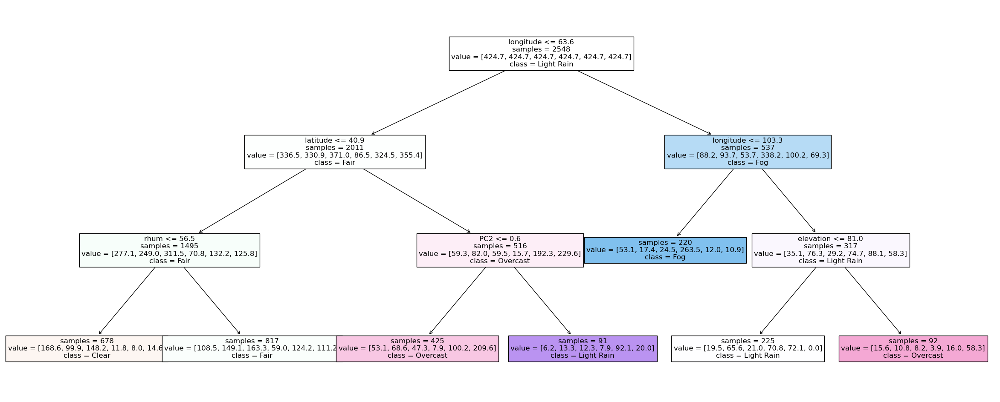

In [60]:
X = weather_df_red.select_dtypes(include='number') 	## Define features
y = weather_df_red['coco']  				## Define target variable

clf = tree.DecisionTreeClassifier(max_depth=4,class_weight="balanced", max_leaf_nodes = 7) ## Define a simple decision tree

clf = clf.fit(X, y)		## training

plt.figure(figsize=(30,12))  ## Plot the full decision tree
anno = tree.plot_tree(	clf, 									## Decision tree
			   	feature_names=clf.feature_names_in_.tolist(),	## Features names
			   	class_names = clf.classes_.tolist(),			## Weather condition text
				filled = True,									## Colored by class decision
				impurity =False,								## For simiplicity exclude impurity values at splits
				precision=1,									## decimal precision
				fontsize=12)									## Fontsize for readibility

## Insights into more complex ML models: Random Forest
### Plotting results: confusion matrix
Important for Confusion Matrix visualization is color + number per entry for pattern exploration and precision

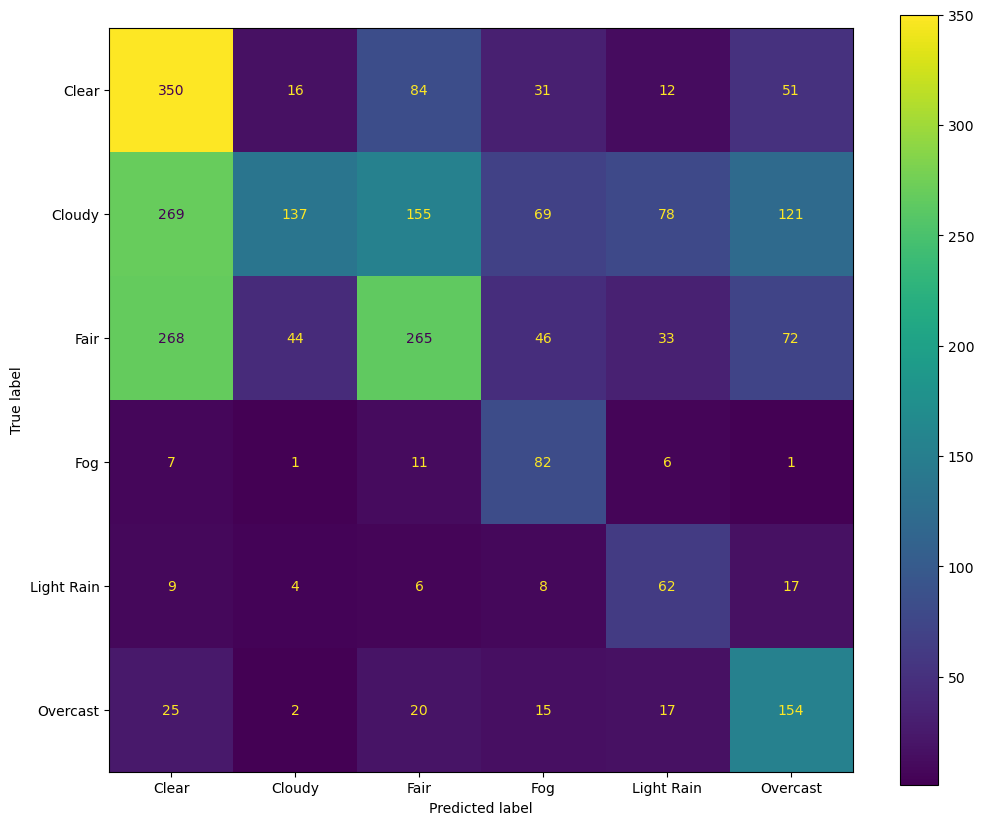

In [63]:
clf_rf = RandomForestClassifier(n_estimators=100,  class_weight="balanced", max_leaf_nodes=20)
# clf_rf = RandomForestClassifier(n_estimators=100,  class_weight=None, max_leaf_nodes=20) ## What happens if we negelect class imbalance?


output = cross_validate(clf_rf, X, y, cv=5, scoring = 'accuracy', return_estimator =True) ## RandomForest is non-deterministic ML -> Cross-validation for more robust results

clf_rf_1 = output['estimator'][0] ## Select a learned RF from the cross-validation

y_pred = clf_rf_1.predict(X)
labels = clf_rf_1.classes_.tolist()
cm = confusion_matrix(y, y_pred, labels=labels)
fig, ax = plt.subplots(figsize=(12,10))
ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels).plot(ax=ax) 

## Getting explainability from feature importance
### Extracting importance from learned models across all cross validations for robustness

In [64]:
feature_importances = pd.DataFrame(X.columns.to_list(), index = X.columns.to_list(), columns=['feature']) ## Empty Data frame definition

for idx,estimator in enumerate(output['estimator']):  ## For each tree in RF
    feature_importances = feature_importances.join(         
            pd.DataFrame(estimator.feature_importances_ ,             ## Calculated feature importance
                        index = estimator.feature_names_in_.tolist(), ## Feature Names
                        columns=['importance_cv'+str(idx+1)])         ## Save from which CV split
            )

# feature_importances
feature_importances_long = pd.wide_to_long( feature_importances, stubnames="importance_cv",i="feature",j="cv") 

feature_importances_long ## We need typically long format for plotting in grammar of graphics


,,importance_cv
feature,cv,
latitude,1,0.154652
longitude,1,0.190243
elevation,1,0.077583
tavg,1,0.030209
tmin,1,0.024264
...,...,...
rhum,5,0.091770
TSNE1,5,0.049369
TSNE2,5,0.079973


## Show importance as bar chart including errorbars
### Trick: flip x and y axis for readibility

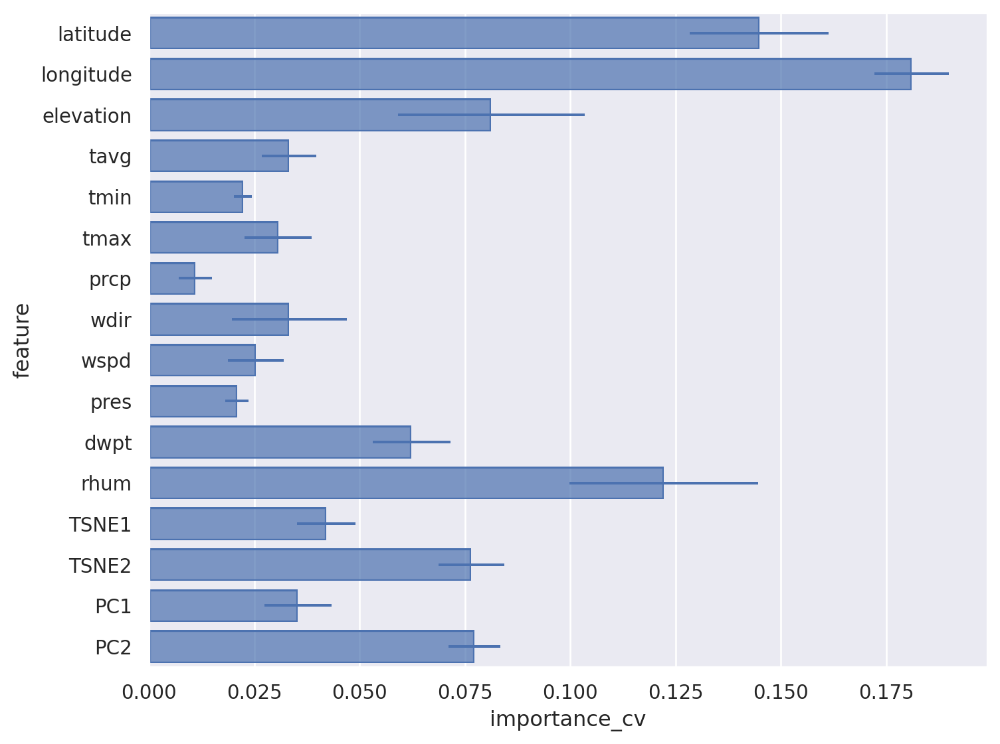

In [65]:
(
    so.Plot(feature_importances_long,x='importance_cv',y='feature')
    .add(so.Bar(), so.Agg())				## Bar plot showing the average
	.add(so.Range(), so.Est(errorbar="sd"))	## Whiskers showing the standard deviation
	.layout(size=(8, 6))	
)

## There are problems with bar charts and errorbars: https://doi.org/10.1371/journal.pbio.1002128
### Better show points/dots for every trained model (sample) and statistics

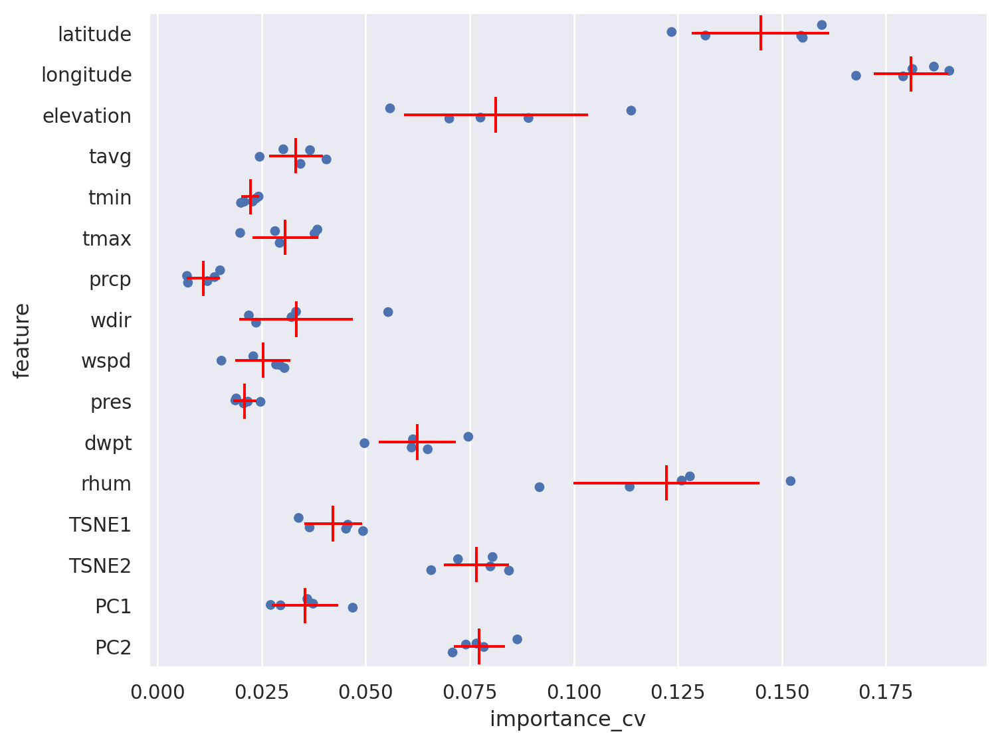

In [66]:
(
    so.Plot(feature_importances_long,x='importance_cv',y='feature')
	.add(so.Dot(pointsize=5), so.Shift(y=.0), so.Jitter(.5)) ## Jitter and Shift avoid overplotting 
    .add(so.Dash(color="red"), so.Agg())					## Show a dash with the average
	.add(so.Range(color="red"), so.Est(errorbar="sd"))		## Show the range of the standard deviation
	.layout(size=(8, 6))	
)

# Part 4: Homework and discussion: 
### Looking at the clustering in TSNE plots. How to check and plot city assignment to clusters? Are cities always in the same cluster?
### What is driving cluster assigment? Regions, day/night, weather ...